## Import

In [1]:
# basic imports
import numpy as np
import IPython
import IPython.display as ipd
import librosa
import libfmp.c3
import torch

import sys
sys.path.append("..")

In [2]:
from warping.backbone import EncoderDecoder
from warping.interpolation import interpolate_latents
from warping.plot_utils import plot_dtw

/home/dmgvrlv/miniconda3/envs/warping/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Encode audio

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
encdec = EncoderDecoder(device=device)

In [5]:
#audio_path = "../audio_examples/campanella/campanella1.mp3"
#audio_path = "../audio_examples/beethoven/beethoven_piano.mp3"
#audio_path = "../audio_examples/knockin_on/bob_dylan.mp3"
#audio_path = "../audio_examples/drums/drums_fast.mp3"
#audio_path = "../audio_examples/chopin/chopin_ballade.mp3"
#audio_path = "../audio_examples/traumerei/traumerei_romero.mp3"
#audio_path = "../audio_examples/nirvana/nirvana.mp3"
audio_path = "../audio_examples/guitar/guitar_excerpt.mp3"
X_audio, sr = librosa.load(audio_path, sr=44100)
ipd.display(ipd.Audio(X_audio, rate=sr))

In [6]:
#audio_path = "../audio_examples/campanella/campanella2.mp3"
#audio_path = "../audio_examples/beethoven/beethoven_orchestra.mp3"
#audio_path = "../audio_examples/knockin_on/avril_lavigne.mp3"
#audio_path = "../audio_examples/drums/drums_slow.mp3"
#audio_path = "../audio_examples/chopin/chopin_ballade_transposed.mp3"
#audio_path = "../audio_examples/traumerei/traumerei_colliard.mp3"
#audio_path = "../audio_examples/nirvana/nirvana_unplugged.mp3"
audio_path = "../audio_examples/guitar/guitar_excerpt_gp.mp3"
Y_audio, sr = librosa.load(audio_path, sr=44100)
ipd.display(ipd.Audio(Y_audio, rate=sr))

In [7]:
X_latent = encdec.encode(X_audio).squeeze()
X_latent = X_latent.cpu().numpy()
print(f'Shape of latents: {X_latent.shape}')

Shape of latents: (64, 141)


In [8]:
Y_latent = encdec.encode(Y_audio).squeeze()
Y_latent = Y_latent.cpu().numpy()
print(f'Shape of latents: {Y_latent.shape}')

Shape of latents: (64, 171)


## DTW visualization

In [9]:
N = 4410
H = 2205
X = librosa.feature.chroma_stft(y=X_audio, sr=sr, tuning=0, norm=2, hop_length=H, n_fft=N)
Y = librosa.feature.chroma_stft(y=Y_audio, sr=sr, tuning=0, norm=2, hop_length=H, n_fft=N)

In [10]:
C = libfmp.c3.compute_cost_matrix(X, Y)
D = libfmp.c3.compute_accumulated_cost_matrix(C)
P = libfmp.c3.compute_optimal_warping_path(D)

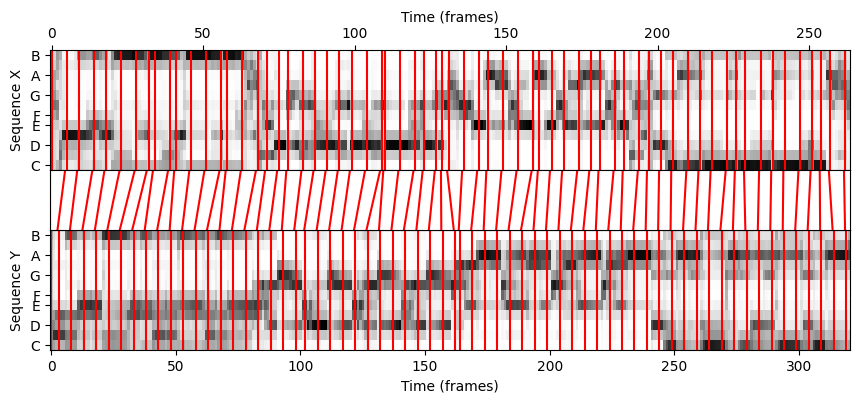

In [11]:
plot_dtw(X, Y, P, X, Y, H)

In [12]:
C = libfmp.c3.compute_cost_matrix(X_latent, Y_latent)
D = libfmp.c3.compute_accumulated_cost_matrix(C)
P = libfmp.c3.compute_optimal_warping_path(D)

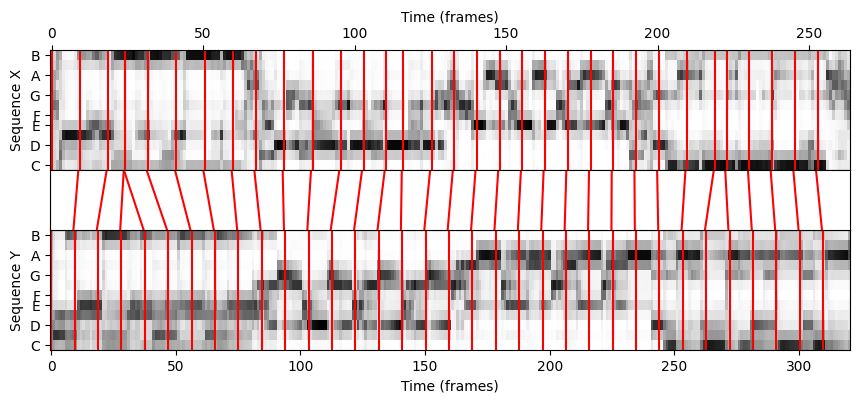

In [13]:
plot_dtw(X_latent,
         Y_latent,
         P,
         X,
         Y,
         H)

## Interpolate

In [14]:
alpha = 0.2

bar = interpolate_latents(X_latent,
                          Y_latent,
                          P,
                          alpha=alpha)

wv_rec = encdec.decode(torch.from_numpy(bar).half().to(device))
ipd.display(ipd.Audio(wv_rec, rate=sr))

In [15]:
alpha = 0.4

bar = interpolate_latents(X_latent,
                          Y_latent,
                          P,
                          alpha=alpha)

wv_rec = encdec.decode(torch.from_numpy(bar).half().to(device))
ipd.display(ipd.Audio(wv_rec, rate=sr))

In [16]:
alpha = 0.6

bar = interpolate_latents(X_latent,
                          Y_latent,
                          P,
                          alpha=alpha)

wv_rec = encdec.decode(torch.from_numpy(bar).half().to(device))
ipd.display(ipd.Audio(wv_rec, rate=sr))

In [17]:
alpha = 0.8

bar = interpolate_latents(X_latent,
                          Y_latent,
                          P,
                          alpha=alpha)

wv_rec = encdec.decode(torch.from_numpy(bar).half().to(device))
ipd.display(ipd.Audio(wv_rec, rate=sr))